# Import Library

In [ ]:
import warnings
warnings.filterwarnings('ignore') 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from tqdm import tqdm

import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from PIL import Image
import torchvision
from torchvision import transforms, models, datasets
from torchvision.datasets import ImageFolder
import torch.optim as optim
import torch.nn.functional as F

import colorama
from colorama import Fore, Style

from torchsummary import summary

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

print(f'DEVICE is : {DEVICE}')

# Dataset Importing

In [2]:
Root_dir = "/kaggle/input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)"
train_dir = Root_dir + "/train"
valid_dir = Root_dir + "/valid"
test_dir = "/kaggle/input/new-plant-diseases-dataset/test"
Diseases_classes = os.listdir(train_dir)

In [3]:
plt.figure(figsize=(60,60), dpi=200)
cnt = 0
plant_names = []
tot_images = 0

for i in Diseases_classes:
    cnt += 1
    plant_names.append(i)
    plt.subplot(7,7,cnt)
    
    image_path = os.listdir(train_dir + "/" + i)
    print(Fore.GREEN)
    print("The Number of Images in " +i+ ":", len(image_path), end= " ")
    tot_images += len(image_path)
    
    img_show = plt.imread(train_dir + "/" + i + "/" + image_path[0])
    
    plt.imshow(img_show)
    plt.xlabel(i,fontsize=30)
    plt.xticks([])
    plt.yticks([])
    
    
print("\n\nTotal Number of Images in Directory: ", tot_images)


The Number of Images in Tomato___Late_blight: 1851 
The Number of Images in Tomato___healthy: 1926 
The Number of Images in Grape___healthy: 1692 
The Number of Images in Orange___Haunglongbing_(Citrus_greening): 2010 
The Number of Images in Soybean___healthy: 2022 
The Number of Images in Squash___Powdery_mildew: 1736 
The Number of Images in Potato___healthy: 1824 
The Number of Images in Corn_(maize)___Northern_Leaf_Blight: 1908 
The Number of Images in Tomato___Early_blight: 1920 
The Number of Images in Tomato___Septoria_leaf_spot: 1745 
The Number of Images in Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot: 1642 
The Number of Images in Strawberry___Leaf_scorch: 1774 
The Number of Images in Peach___healthy: 1728 
The Number of Images in Apple___Apple_scab: 2016 
The Number of Images in Tomato___Tomato_Yellow_Leaf_Curl_Virus: 1961 
The Number of Images in Tomato___Bacterial_spot: 1702 
The Number of Images in Apple___Black_rot: 1987 
The Number of Images in Blueberry___heal

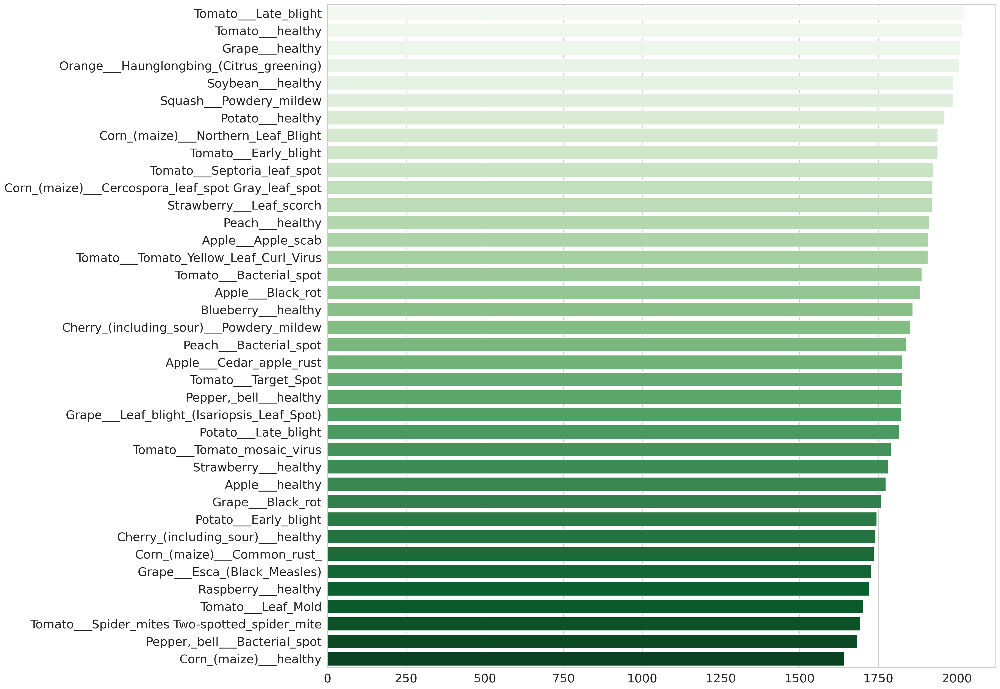

In [4]:
plant_names = []
Len = []
for i in Diseases_classes:
    plant_names.append(i)
    imgs_path = os.listdir(train_dir + "/" + i)
    Len.append(len(imgs_path))

Len.sort(reverse=True)

sns.set(style="whitegrid", color_codes=True)
plt.figure(figsize=(20,20),dpi=200)
ax = sns.barplot(x= Len, y= plant_names, palette="Greens")
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

In [ ]:
# def image_count(data_dir):
#         print(f'\nCounting Images in Category set :')
#         total_img = 0
#         # Iterate over each category (subfolder) in the split
        
#         for sub_path in sorted(os.listdir(data_dir)):
#             sub_cat = os.path.join(data_dir,sub_path)
#             # Count the number of files, assuming they are all images
#             num_images = len([name for name in os.listdir(sub_cat) if os.path.isfile(
#                     os.path.join(sub_cat, name))])
#             print(f"    {sub_path}: {num_images} images")
#             total_img += num_images

#         print(f'\n\nTotal Valid Images : {total_img}')
# image_count(valid_dir)

# Data Augmentation

In [5]:
train_transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.RandomRotation(degrees=15),
    transforms.ToTensor(),  # Convert images to PyTorch tensors
    transforms.Normalize(mean=[0.5,0.5,0.5], std=[0.5,0.5,0.5])  # Normalize the data to [-1, 1]
])

test_transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),  # Convert images to PyTorch tensors
    transforms.Normalize(mean=[0.5,0.5,0.5], std=[0.5,0.5,0.5])  # Normalize the data to [-1, 1]
])

val_transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),  # Convert images to PyTorch tensors
    transforms.Normalize(mean=[0.5,0.5,0.5], std=[0.5,0.5,0.5])  # Normalize the data to [-1, 1]
])

In [6]:
train = datasets.ImageFolder(root=train_dir, transform=train_transform)
valid = datasets.ImageFolder(root=valid_dir, transform=val_transform)

In [7]:
print(f'Train dataset : {len(train)}, {type(train)}')

print(f'Validation dataset : {len(valid)}')

Train dataset : 70295, <class 'torchvision.datasets.folder.ImageFolder'>
Validation dataset : 17572


In [8]:
train[0]

(tensor([[[-1., -1., -1.,  ..., -1., -1., -1.],
          [-1., -1., -1.,  ..., -1., -1., -1.],
          [-1., -1., -1.,  ..., -1., -1., -1.],
          ...,
          [-1., -1., -1.,  ..., -1., -1., -1.],
          [-1., -1., -1.,  ..., -1., -1., -1.],
          [-1., -1., -1.,  ..., -1., -1., -1.]],
 
         [[-1., -1., -1.,  ..., -1., -1., -1.],
          [-1., -1., -1.,  ..., -1., -1., -1.],
          [-1., -1., -1.,  ..., -1., -1., -1.],
          ...,
          [-1., -1., -1.,  ..., -1., -1., -1.],
          [-1., -1., -1.,  ..., -1., -1., -1.],
          [-1., -1., -1.,  ..., -1., -1., -1.]],
 
         [[-1., -1., -1.,  ..., -1., -1., -1.],
          [-1., -1., -1.,  ..., -1., -1., -1.],
          [-1., -1., -1.,  ..., -1., -1., -1.],
          ...,
          [-1., -1., -1.,  ..., -1., -1., -1.],
          [-1., -1., -1.,  ..., -1., -1., -1.],
          [-1., -1., -1.,  ..., -1., -1., -1.]]]),
 0)

In [9]:
img, label = train[0]
print(img.shape, label)

torch.Size([3, 224, 224]) 0



Label :Apple___Apple_scab(0)

Label :Apple___Black_rot(1)

Label :Apple___Cedar_apple_rust(2)

Label :Blueberry___healthy(4)

Label :Cherry_(including_sour)___healthy(6)

Label :Corn_(maize)___Common_rust_(8)

Label :Tomato___Septoria_leaf_spot(32)

Label :Tomato___healthy(37)


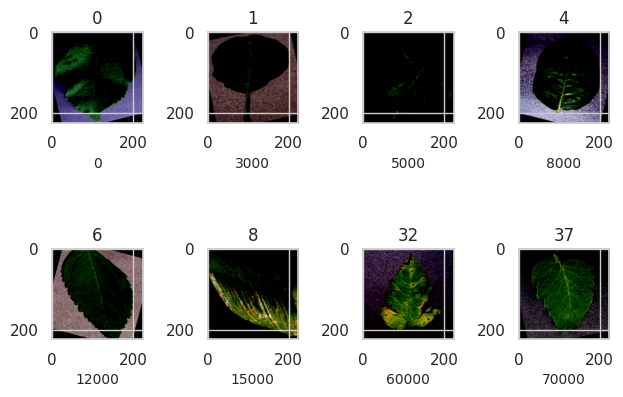

In [10]:
def show_image(image, label):
    print("Label :" + train.classes[label] + "(" + str(label) + ")")
    plt.imshow(image.permute(1, 2, 0))
    
    
image_list = [0, 3000, 5000, 8000, 12000, 15000, 60000, 70000]
    
chs = 0
for img in image_list:
    chs += 1
    plt.subplot(2,4,chs)
    print(Fore.GREEN)
    plt.tight_layout()
    plt.xlabel(img,fontsize=10)
    plt.title(train[img][1])
    
    show_image(*train[img])

# CBAM attention model

In [ ]:
batch_size = 128
# DataLoaders for training and validation
trainloader = DataLoader(
    train,
    batch_size, 
    shuffle=True, 
    num_workers=2,
    pin_memory=True, 
    drop_last=True
)

validloader = DataLoader(
    valid, 
    batch_size,
    shuffle=False, 
    num_workers=2, 
    pin_memory=True, 
    drop_last=True
)

In [ ]:
class channelAttention(nn.Module):
    def __init__(self, input_feature, ratio=8):
        super(channelAttention,self).__init__()

        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)
        self.fc = nn.Sequential(
            nn.Conv2d(input_feature, input_feature//ratio, 1, bias=False),
            nn.ReLU(),
            nn.Conv2d(input_feature//ratio, input_feature, 1, bias=False),
            #nn.Sigmoid()
        )

        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = self.fc(self.avg_pool(x))
        max_out = self.fc(self.max_pool(x))
        output = avg_out + max_out
        #return output
        return self.sigmoid(output)



class spatialAttention(nn.Module):
    def __init__(self, kernel_size=7):
        super(spatialAttention, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(2,8,kernel_size, padding=kernel_size//2, bias=False),
            nn.ReLU(inplace=True),
            nn.Conv2d(8,1, kernel_size=1)
        )

        self.sigmoid = nn.Sigmoid()


    def forward(self, x):
        avg_out = torch.mean(x, dim=1, keepdim=True)
        max_out = torch.max(x, dim=1, keepdim=True)[0]
        x_concat = torch.cat([avg_out, max_out], dim=1)
        out = self.conv(x_concat)

        return self.sigmoid(out) * x

# Full CBAM Block
class CBAM(nn.Module):
    def __init__(self, channels, ratio=8, kernel_size=7):
        super(CBAM, self).__init__()
        self.ca = channelAttention(channels, ratio)
        self.sa = spatialAttention(kernel_size)

    def forward(self, x):
        x = x * self.ca(x)
        x = x * self.sa(x)
        return x

In [ ]:
class CBAM_CNN(nn.Module):
    def __init__(self):
        super(CBAM_CNN, self).__init__()

        self.conv1 = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            CBAM(32),
            nn.MaxPool2d(2)
        )
        self.cbam1 = CBAM(32)
        self.conv2 = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            CBAM(64),
            nn.MaxPool2d(2)
        )
        self.cbam2 = CBAM(64)

        self.conv3 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            CBAM(128),
            nn.MaxPool2d(2)
        )
        self.cbam3 = CBAM(128)

        self.conv4 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            CBAM(256),
            nn.MaxPool2d(2)
        )
        # Now compute flatten size
        dummy_input = torch.zeros(1, 3, 224, 224)
        x = self.conv1(dummy_input)
        x = self.cbam1(x)
        x = self.conv2(x)
        x = self.cbam2(x)
        x = self.conv3(x)
        x = self.cbam3(x)
        x = self.conv4(x)
        flatten_size = x.view(1, -1).size(1)

        self.fc = nn.Linear(flatten_size, 38)  # Adjust size based on pooling and input

    def forward(self, x):
        x = self.conv1(x)   # [B, 32, H/2, W/2]
        x = self.conv2(x)   # [B, 64, H/4, W/4]
        x = self.conv3(x)   # [B, 128, H/8, W/8]
        x = self.conv4(x)   # [B, 256, 1, 1]
        x = x.view(x.size(0), -1)  # Flatten
        x = self.fc(x)
        return x


model = CBAM_CNN()

model = model.to(DEVICE)

print(model.parameters())
# choosing loss and Optimizer function..................
criterion = nn.CrossEntropyLoss()

optimizers = optim.Adam(model.parameters(), lr=0.001, weight_decay=0.005)

# Print model summary
#summary(model, (3, 128, 128))

# Check parameters
print(sum(p.numel() for p in model.parameters() if p.requires_grad))


In [ ]:
def train(model, train_loader, val_loader, epochs=30):
    for epoch in range(epochs):
        model.train()
        total_loss = 0
        correct = 0

        for images, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}"):
            images, labels = images.to(DEVICE), labels.to(DEVICE)

            optimizers.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizers.step()

            total_loss += loss.item()
            correct += (outputs.argmax(1) == labels).sum().item()

        acc = 100 * correct / len(train_loader.dataset)
        print(f"Train Loss: {total_loss:.4f}, Accuracy: {acc:.2f}%")

        # call Validation function........................
        validate(model, val_loader)

    torch.save(model.state_dict(), '../models/crops_cbam_Model.pth')

def validate(model, val_loader):
    model.eval()
    correct = 0

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(DEVICE), labels.to(DEVICE)
            outputs = model(images)
            correct += (outputs.argmax(1) == labels).sum().item()

    acc = 100 * correct / len(val_loader.dataset)
    print(f"Validation Accuracy: {acc:.4f}%")

In [ ]:
train(model, train_loader=trainloader, val_loader=validloader, epochs=20)

In [ ]:
torch.cuda.empty_cache()

# CNN model with custom resnet

In [11]:
batch_size = 64
# DataLoaders for training and validation
trainloader = DataLoader(
    train,
    batch_size, 
    shuffle=True, 
    num_workers=2,
    pin_memory=True, 
    drop_last=True
)

validloader = DataLoader(
    valid, 
    batch_size,
    shuffle=False, 
    num_workers=2, 
    pin_memory=True, 
    drop_last=True
)

In [12]:
# for loading in the device (GPU if available else CPU)
class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dataloader, device):
        self.dataloader = dataloader
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dataloader:
            yield to_device(b, self.device)
        
    def __len__(self):
        """Number of batches"""
        return len(self.dataloader)

In [13]:
# for moving data to device (CPU or GPU)
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

In [14]:
# Moving data into GPU, WrappedDataLoader
trainloader = DeviceDataLoader(trainloader, DEVICE)
validloader = DeviceDataLoader(validloader, DEVICE)

# # # Get some random training images
dataiter = iter(trainloader)
images, labels = next(dataiter)

print(images.shape)

torch.Size([64, 3, 224, 224])


In [15]:
# for calculating the accuracy
def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))

In [17]:
class ImageClassificationBase(nn.Module):
    
    def training_step(self, batch):
        images, labels = batch 
        #images, labels = images.to(DEVICE), labels.to(DEVICE) # move to GPU
        out = self(images)                  # Generate predictions
        loss = F.cross_entropy(out, labels) # Calculate loss
        return loss
    
    def validation_step(self, batch):
        images, labels = batch 
        #images, labels = images.to(DEVICE), labels.to(DEVICE) # move to GPU
        out = self(images)                    # Generate predictions
        loss = F.cross_entropy(out, labels)   # Calculate loss
        acc = accuracy(out, labels)           # Calculate accuracy
        return {'val_loss': loss.detach(), 'val_acc': acc}
        
    def validation_epoch_end(self, outputs):
        batch_losses = [x['val_loss'] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()   # Combine losses
        batch_accs = [x['val_acc'] for x in outputs]
        epoch_acc = torch.stack(batch_accs).mean()      # Combine accuracies
        return {'val_loss': epoch_loss.item(), 'val_acc': epoch_acc.item()}
    
    def epoch_end(self, epoch, result):
        print("Epoch [{}], train_loss: {:.4f}, val_loss: {:.4f}, val_acc: {:.4f}".format(
            epoch, result['train_loss'], result['val_loss'], result['val_acc']))

In [18]:
# convolution block with BatchNormalization
def ConvBlock(in_channels, out_channels, pool=False):
    layers = [nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
             nn.BatchNorm2d(out_channels),
             nn.ReLU(inplace=True)]
    if pool:
        layers.append(nn.MaxPool2d(4))
    return nn.Sequential(*layers)

In [19]:
# resnet architecture 
class CNN_NeuralNet(ImageClassificationBase):
    def __init__(self, in_channels, num_diseases):
        super().__init__()
        
        self.conv1 = ConvBlock(in_channels, 64)
        self.conv2 = ConvBlock(64, 128, pool=True) 
        self.res1 = nn.Sequential(ConvBlock(128, 128), ConvBlock(128, 128))
        
        self.conv3 = ConvBlock(128, 256, pool=True) 
        self.conv4 = ConvBlock(256, 512, pool=True)
        #self.conv5 = ConvBlock(256, 256, pool=True)
        #self.conv6 = ConvBlock(256, 512, pool=True)
        #self.conv7 = ConvBlock(512, 512, pool=True)
        
        self.res2 = nn.Sequential(ConvBlock(512, 512), ConvBlock(512, 512))

        # self.classifier = nn.Sequential(nn.MaxPool2d(4),
        #                                nn.Flatten(),
        #                                nn.Linear(512, num_diseases))
        
        self.classifier = nn.Sequential(
                nn.AdaptiveAvgPool2d((1, 1)),  # Safe replacement
                nn.Flatten(),
                nn.Linear(512, num_diseases)
        )
        
    def forward(self, x): # x is the loaded batch
        out = self.conv1(x)
        out = self.conv2(out)
        out = self.res1(out) + out
        out = self.conv3(out)
        out = self.conv4(out)
        #out = self.conv5(out)
        #out = self.conv6(out)
        #out = self.conv7(out)
        out = self.res2(out) + out
        out = self.classifier(out)
        
        return out        

In [20]:
# defining the model and moving it to the GPU
# 3 is number of channels RGB, len(train.classes()) is number of diseases.
model = to_device(CNN_NeuralNet(3, len(train.classes)), DEVICE) 
#model = model.to(DEVICE)
model

CNN_NeuralNet(
  (conv1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (conv2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  )
  (res1): Sequential(
    (0): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inpl

In [22]:
# for training
@torch.no_grad()
def evaluate(model, val_loader):
    model.eval()
    outputs = [model.validation_step(batch) for batch in val_loader]
    return model.validation_epoch_end(outputs)

In [23]:
def get_lr(optimizer):
    if optimizer is None:
        raise ValueError("Optimizer is not defined.")
    if not optimizer.param_groups:
        raise ValueError("Optimizer has no param groups.")
    else:
        for param_group in optimizer.param_groups:
            return param_group['lr']

In [24]:
%%time
history = [evaluate(model, validloader)]
history

CPU times: user 54.6 s, sys: 4.97 s, total: 59.5 s
Wall time: 1min 11s


[{'val_loss': 3.637941598892212, 'val_acc': 0.027258211746811867}]

# Hyperparameters Function:

Now it's time to create a function that get epochs, learning rate, train and validation loader and optim function..

Clear GPU memory after PyTorch model training without restarting kernel with torch.cuda.empty_cache()

In [25]:
def fit_OneCycle(epochs, max_lr, model, train_loader, val_loader, weight_decay=0,
                grad_clip=None, opt_func=torch.optim.SGD):
    torch.cuda.empty_cache()
    history = []  #For collecting the results
    
    optimizer = opt_func(model.parameters(), max_lr, weight_decay=weight_decay)
    # scheduler for one cycle learniing rate
    #Sets the learning rate of each parameter group according to the 1cycle learning rate policy. 
    #The 1cycle policy anneals the learning rate from an initial learning rate to some 
    #maximum learning rate and then from that maximum learning rate to some minimum learning rate
    #much lower than the initial learning rate. 
    sched = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr,
                                                epochs=epochs, steps_per_epoch=len(train_loader))
    
    
    for epoch in range(epochs):
        # Training
        model.train()
        train_losses = []
        lrs = []
        for batch in train_loader:
            loss = model.training_step(batch)
            train_losses.append(loss)
            loss.backward()
            
            # gradient clipping
            #Clip the gradients of an iterable of parameters at specified value.
            #All from pytorch documantation.
            if grad_clip: 
                nn.utils.clip_grad_value_(model.parameters(), grad_clip)
                
            optimizer.step()
            optimizer.zero_grad()
            
            # recording and updating learning rates
            lrs.append(get_lr(optimizer))
            sched.step()
             # validation
        
        result = evaluate(model, val_loader)
        result['train_loss'] = torch.stack(train_losses).mean().item()
        result['lrs'] = lrs
        model.epoch_end(epoch, result)
        history.append(result)
        
    torch.save(model.state_dict(), '../models/resnet_Model.pth')
    return history

### Training Model:

Evaluate function added to history of model.

Then we can define our hyperparameters like number of epochs, learning rate and ... .

Now we can update history with fit_OneCycle function (Adding two function together). Attention to history = [] in the second function. Now we have model evaluation.

In [ ]:
num_epoch = 15
lr_rate = 0.001
grad_clip = 0.15
weight_decay = 1e-4
optims = torch.optim.Adam

history += fit_OneCycle(num_epoch, lr_rate, model, trainloader, validloader, 
                             grad_clip=grad_clip, 
                             weight_decay=weight_decay, 
                             opt_func=optims)

Epoch [0], train_loss: 0.7064, val_loss: 0.2352, val_acc: 0.9408
Epoch [1], train_loss: 0.1945, val_loss: 0.4721, val_acc: 0.8537
Epoch [2], train_loss: 0.1401, val_loss: 0.2880, val_acc: 0.9057


In [ ]:
val_acc = []
val_loss = []
train_loss = []

for i in history:
    val_acc.append(i['val_acc'])
    val_loss.append(i['val_loss'])
    train_loss.append(i.get('train_loss'))

In [ ]:
epoch_count = range(1,7)
plt.figure(figsize=(10,5), dpi=200)
plt.plot(epoch_count, train_loss, 'r--', color= 'orangered')
plt.plot(epoch_count, val_loss, '--bo',color= 'green', linewidth = '2.5', label='line with marker')
plt.legend(['Training Loss', 'Val Loss'])
plt.title('Number of epochs & Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.xticks(np.arange(1,7,1))
plt.show();

In [ ]:
epoch_count = range(1,7)
plt.figure(figsize=(10,5), dpi=200)
plt.plot(epoch_count, val_acc, '--bo',color= 'green', linewidth = '2.5', label='line with marker')
plt.legend(['Val Acc'])
plt.title('Number of epochs & Acc')
plt.xlabel('Epoch')
plt.ylabel('Acc')
plt.xticks(np.arange(1,7,1))
plt.show();

In [ ]:
test = ImageFolder(test_dir, transform=test_transform)
test_images = sorted(os.listdir(test_dir + '/test'))
print(Fore.GREEN)
print(test_images)
print(len(test_images))

In [ ]:
def predict_image(img, model):
    """Converts image to array and return the predicted class
        with highest probability"""
    # Convert to a batch of 1
    xb = to_device(img.unsqueeze(0), DEVICE)
    # Get predictions from model
    yb = model(xb)
    # Pick index with highest probability
    _, preds  = torch.max(yb, dim=1)
    # Retrieve the class label

    return train.classes[preds[0].item()]

In [ ]:
# predicting first image
img, label = test[1]
plt.imshow(img.permute(1, 2, 0))
print(Fore.GREEN)
print('Label:', test_images[1], ', Predicted:', predict_image(img, model))

In [ ]:
# predicting first image
img, label = test[5]
plt.imshow(img.permute(1, 2, 0))
print(Fore.GREEN)
print('Label:', test_images[5], ', Predicted:', predict_image(img, model))

In [ ]:
# predicting first image
img, label = test[9]
plt.imshow(img.permute(1, 2, 0))
print(Fore.GREEN)
print('Label:', test_images[9], ', Predicted:', predict_image(img, model))

In [ ]:
# predicting first image
img, label = test[16]
plt.imshow(img.permute(1, 2, 0))
print(Fore.GREEN)
print('Label:', test_images[16], ', Predicted:', predict_image(img, model))

In [ ]:
# predicting first image
img, label = test[26]
plt.imshow(img.permute(1, 2, 0))
print(Fore.GREEN)
print('Label:', test_images[16], ', Predicted:', predict_image(img, model))